<a href="https://colab.research.google.com/github/vermashivam679/YouTube_comments_NLP/blob/master/WordCloud_SA_NER_Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [178]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [179]:
import pandas as pd
import numpy as np

import os
from collections import Counter
import pickle
import matplotlib.pyplot as plt
% matplotlib inline

import cv2
import pprint

import warnings
warnings.filterwarnings("ignore")

In [180]:
root_path = 'drive/My Drive/Compsense/'

In [181]:
# attribution to:
# https://matplotlib.org/3.1.1/gallery/lines_bars_and_markers/horizontal_barchart_distribution.html#sphx-glr-gallery-lines-bars-and-markers-horizontal-barchart-distribution-py
def survey(results, category_names):
    """
    Parameters
    ----------
    results : dict
        A mapping from question labels to a list of answers per category.
        It is assumed all lists contain the same number of entries and that
        it matches the length of *category_names*.
    category_names : list of str
        The category labels.
    """
    labels = list(results.keys())
    data = np.array(list(results.values()))
    data_cum = data.cumsum(axis=1)
    category_colors = plt.get_cmap('RdYlGn')(
        np.linspace(0.85, 0.15, data.shape[1]))

    fig, ax = plt.subplots(figsize=(15, 15))
    ax.invert_yaxis()
    ax.xaxis.set_visible(False)
    ax.set_xlim(0, np.sum(data, axis=1).max())

    for i, (colname, color) in enumerate(zip(category_names, category_colors)):
        widths = data[:, i]
        starts = data_cum[:, i] - widths
        ax.barh(labels, widths, left=starts, height=0.9,
                label=colname, color=color, alpha=0.75)
        xcenters = starts + widths / 2

        r, g, b, _ = color
        text_color = 'black' if r * g * b < 0.5 else 'darkgrey'
        for y, (x, c) in enumerate(zip(xcenters, widths)):
            ax.text(x, y, str(int(c)), ha='center', va='center',
                    color=text_color, fontsize=15)
    ax.legend(ncol=len(category_names), bbox_to_anchor=(0, 1),
              loc='lower left', fontsize=25)
    return fig, ax

In [182]:
def viz_senti(name):
  """
  Takes a search name and creates & saves a sentiment analysis plot.
  
  Parameters
  -------------
  name : (str) 
      youtube search string   
  """

  mydata = pd.read_csv(root_path+'search_'+name+'/'+'results_sentiment.csv')
  mydata['count_v2'] = mydata['count']+ mydata['count_likes']

  temp = mydata.pivot('title', 'label', 'count_v2')
  temp = temp.fillna(0)
  temp = temp['POSITIVE']/(temp['POSITIVE']+temp['NEGATIVE'])
  temp.sort_values(ascending=False, inplace=True)

  results = {key:[temp[key]*100, (1-temp[key])*100] for key in list(temp.index)}
  survey(results, ['POSITIVE', 'NEGATIVE'])
  plt.yticks(fontsize=20)
  plt.savefig(root_path+'search_'+name+'/'+name+'_senit_plot.jpg')
  plt.show()

In [183]:
def get_results(name):
  """
  Takes a search name to plot the wordcloud, creates & saves a sentiment analysis plot and prints NER results.
  
  Parameters
  -------------
  name : (str) 
      youtube search string   
  """

  ## Plot the wordcloud
  print('Word Cloud', '\n-----------------')
  im = cv2.imread(root_path+'search_'+name+'/'+name+'_plot.jpg')
  fig = plt.gcf()
  fig.set_size_inches(15, 9)
  plt.imshow(im)
  plt.axis('image'), plt.xticks([]), plt.yticks([])
  plt.show()

  ## Visualizing Sentiment Analysis
  print('Sentiment Analysis', '\n-----------------')
  viz_senti(name)

  ## getting person, organization & location from video title & description
  file = open(root_path+'search_'+name+'/'+'pmf.pkl','rb')
  person_pmf = pickle.load(file)
  org_pmf = pickle.load(file)
  loc_pmf = pickle.load(file)
  file.close()

  print('Named Entity Recognition', '\n-----------------')
  pp = pprint.PrettyPrinter(indent=4)
  pp.pprint(['Person Frequency', person_pmf, '-----------------'])
  pp.pprint(['Organization Frequency', org_pmf, '-----------------'])
  pp.pprint(['Location Frequency', loc_pmf, '-----------------'])
  print('\n\n')


In [184]:
airlines_india = ['IndiGo Airlines', 'Air India', 'spicejet', 'air asia india', 'vistara airlines']
airlines_canada = ['Air Canada', 'Westjet', 'Flair Airlines', 'Porter Airlines']

other_searches = ['flying beast', 'Cercle', 'The war on drugs_A Deeper Understanding', 
                  'Skinshape_Top Tracks - Skinshape', 'oceanvs orientalis']

## Analysis on Indian Airlines

The results shown below are for top relevent search results returned by YouTube search engine

IndiGo Airlines 


Word Cloud 
-----------------


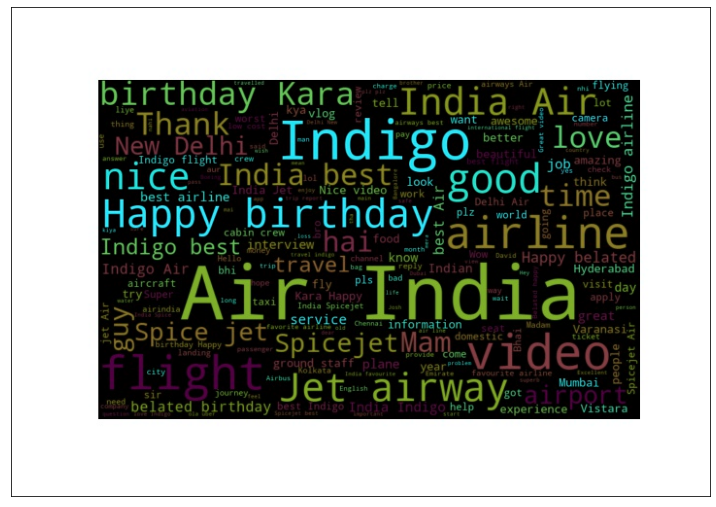

Sentiment Analysis 
-----------------


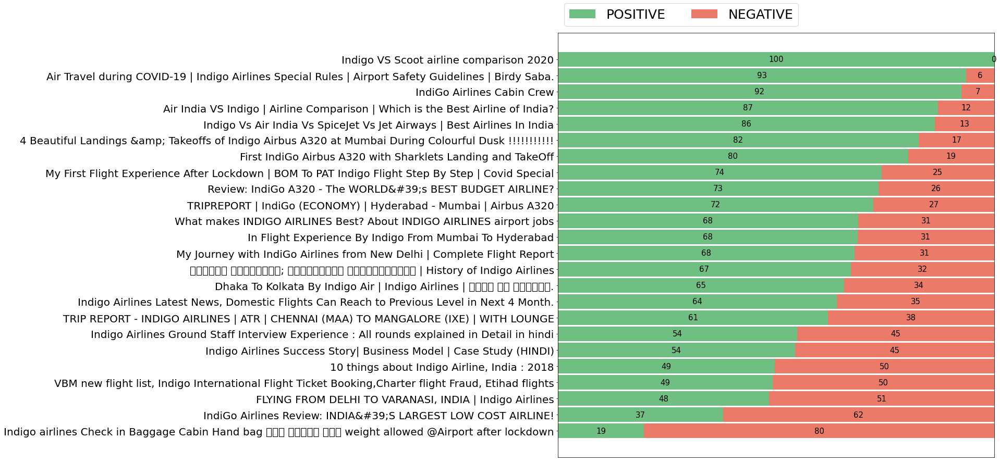

Named Entity Recognition 
-----------------
[   'Person Frequency',
    Counter({'Birdy Saba': 1, 'Dosto aaj': 1, 'FDR': 1, 'Duggal Koi': 1}),
    '-----------------']
[   'Organization Frequency',
    Counter({   'Indigo Airlines': 7,
                'IndiGo Airlines': 4,
                'IndiGo': 4,
                'Airbus': 3,
                'Indigo Airline': 2,
                'Air India': 2,
                'Indian Airlines': 1,
                'Jet Airways': 1,
                'Indigo Vs Air India': 1,
                'SpiceJet': 1,
                'Dhaka To Kolkata By Indigo Air | Indigo Airlines': 1,
                'Dhaka To Kolkata | Indigo Airlines': 1,
                'Sharklets': 1,
                'First IndiGo Airbus A320': 1,
                'This HD-Film': 1,
                'XFW': 1,
                'TakeOff': 1,
                'VBM': 1,
                'Etihad': 1,
                'British Airways': 1,
                'Cabin Crew': 1,
                'TRIP REPORT -

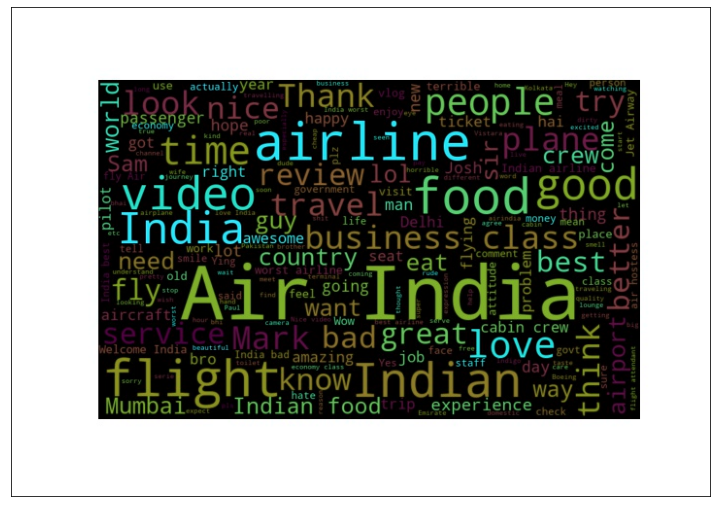

Sentiment Analysis 
-----------------


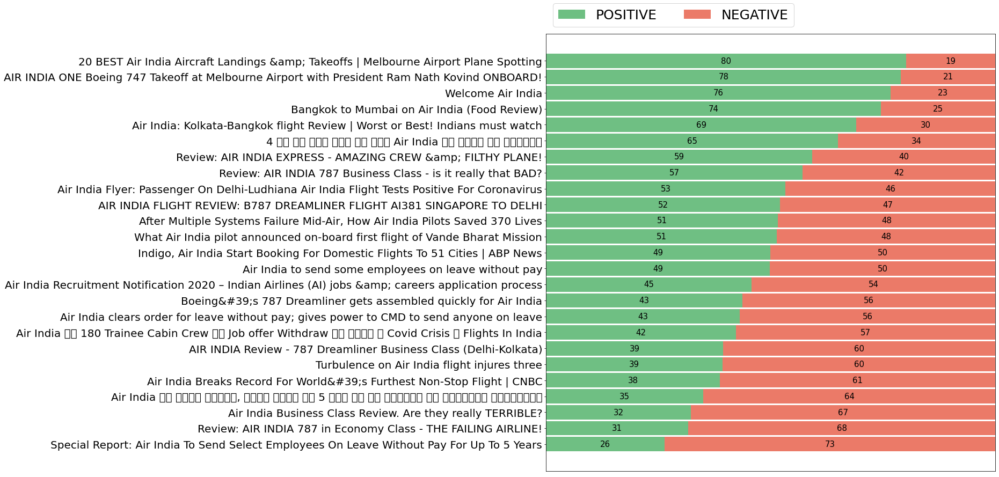

Named Entity Recognition 
-----------------
[   'Person Frequency',
    Counter({'Sam Chui.': 1, 'Ram Nath Kovind': 1}),
    '-----------------']
[   'Organization Frequency',
    Counter({   'Air India': 15,
                'Boeing': 4,
                "Air India's": 2,
                'Kanak News': 1,
                'Eastern Media Limited': 1,
                'Air India Business Class Review': 1,
                'CNBC': 1,
                'AIR INDIA': 1,
                'SFO': 1,
                'Dreamliner': 1,
                'Vande Bharat Mission': 1,
                'Jobs & Careers': 1,
                'Indian Airlines': 1,
                'Air India Recruitment Notification 2020': 1,
                'the Ministry of Civil Aviation': 1,
                'Indigo': 1,
                'AI381': 1}),
    '-----------------']
['Location Frequency', Counter(), '-----------------']



spicejet 


Word Cloud 
-----------------


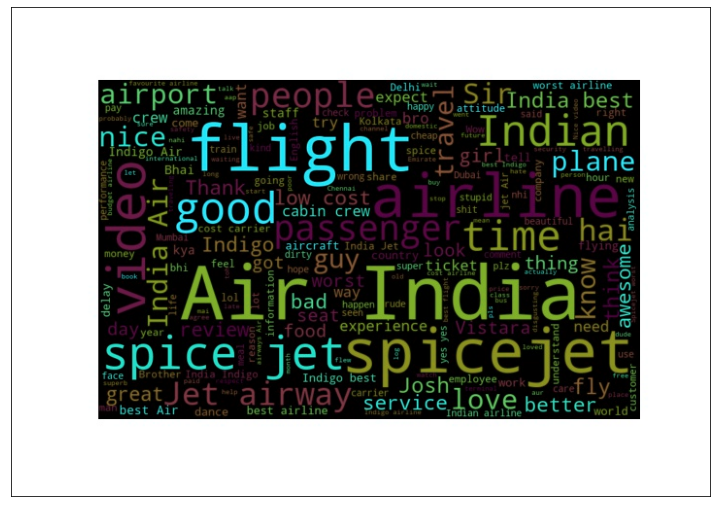

Sentiment Analysis 
-----------------


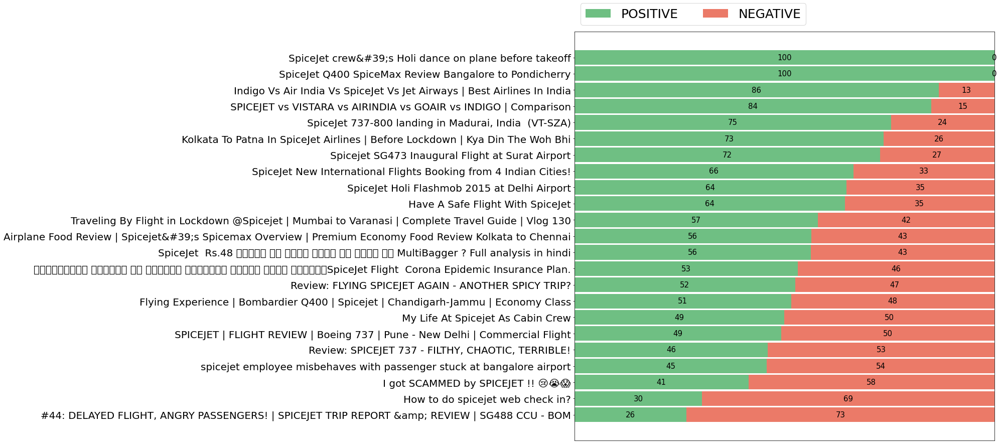

Named Entity Recognition 
-----------------
[   'Person Frequency',
    Counter({   'Din The Woh Bhi': 1,
                '#SpiceJetFlightInsurance': 1,
                'SpiceJet': 1,
                'Max Review Bangalore': 1,
                'Spicejet Inaugural': 1,
                'Debojo Maharshi': 1}),
    '-----------------']
[   'Organization Frequency',
    Counter({   'SpiceJet': 3,
                'New Delhi IGI': 1,
                'Boeing': 1,
                'Jet': 1,
                'SpiceJet 737-800': 1,
                'Kolkata To Patna': 1,
                'SpiceJet Airlines': 1,
                'DEMAT': 1,
                'Telegram Group': 1,
                'YouTube': 1,
                'Sony': 1,
                'Indigo Vs Air India': 1,
                'Air India': 1,
                'Jet Airways': 1,
                'Indigo Airlines': 1,
                'Business/Collaborations': 1,
                'Spicejet': 1,
                'Facebook': 1,
                'CMO'

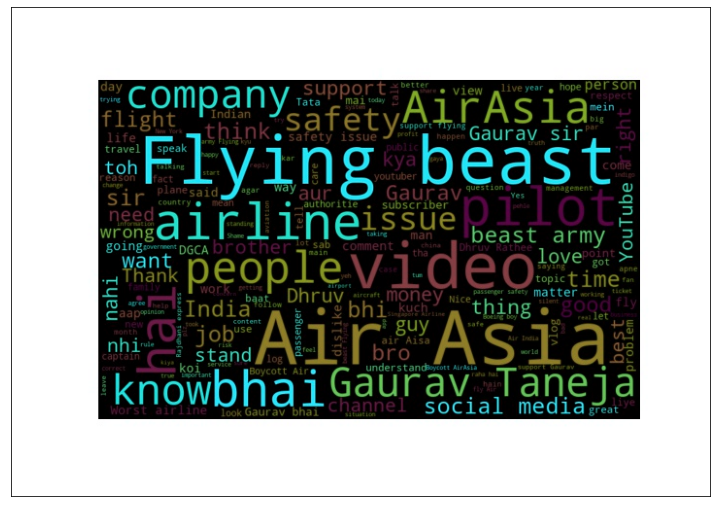

Sentiment Analysis 
-----------------


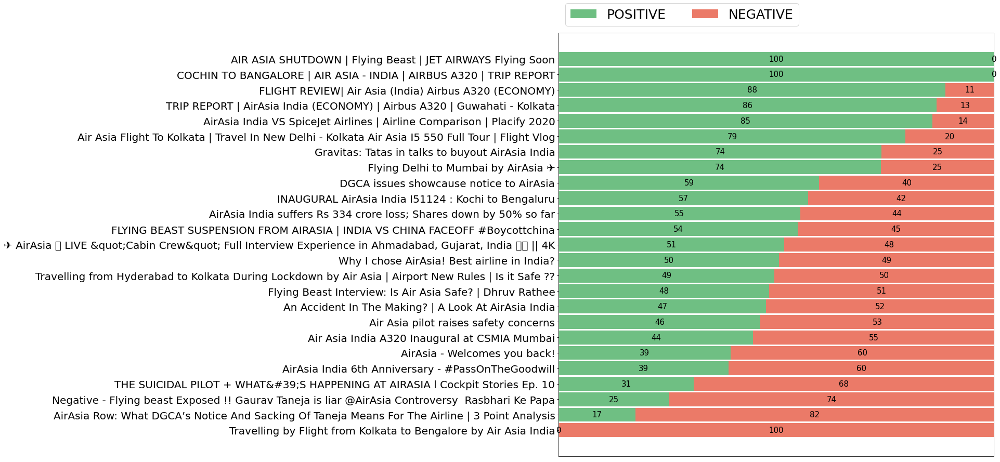

Named Entity Recognition 
-----------------
[   'Person Frequency',
    Counter({   'Gaurav Taneja': 3,
                'Ashiq Rahman:': 1,
                'Durga Puja': 1,
                'Dhruv Rathee': 1,
                'Rasbhari Ke Papa': 1,
                'INAUGURAL': 1}),
    '-----------------']
[   'Organization Frequency',
    Counter({   'AirAsia': 11,
                'AirAsia India': 8,
                'Airbus': 3,
                'Air Asia India': 2,
                'Tata Sons': 2,
                'Tatas': 1,
                'The Tata Group': 1,
                '#PassOnTheGoodwill': 1,
                'Air Asia Airlines': 1,
                'NEWS9': 1,
                'Air Asia': 1,
                'CSMIA Mumbai': 1,
                'Air Asia India A320': 1,
                'DGCA': 1,
                'Tata': 1,
                'Gauravtaneja': 1,
                "AirAsia India's": 1,
                'Marriott Ahmedabad': 1,
                'AirAsia Airline': 1,
           

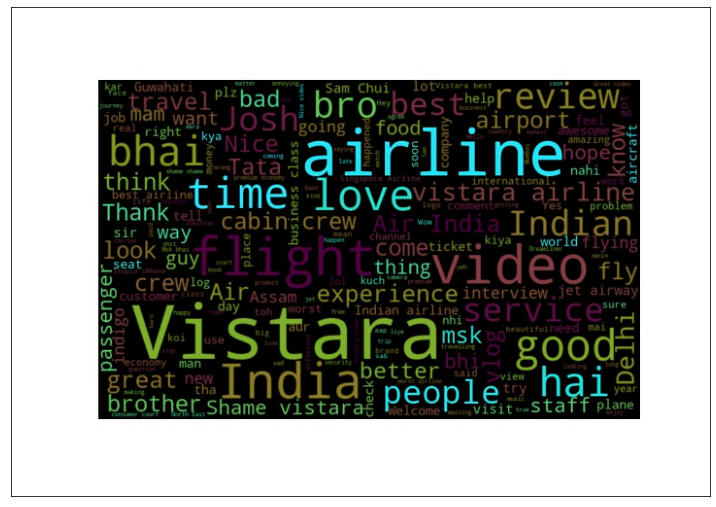

Sentiment Analysis 
-----------------


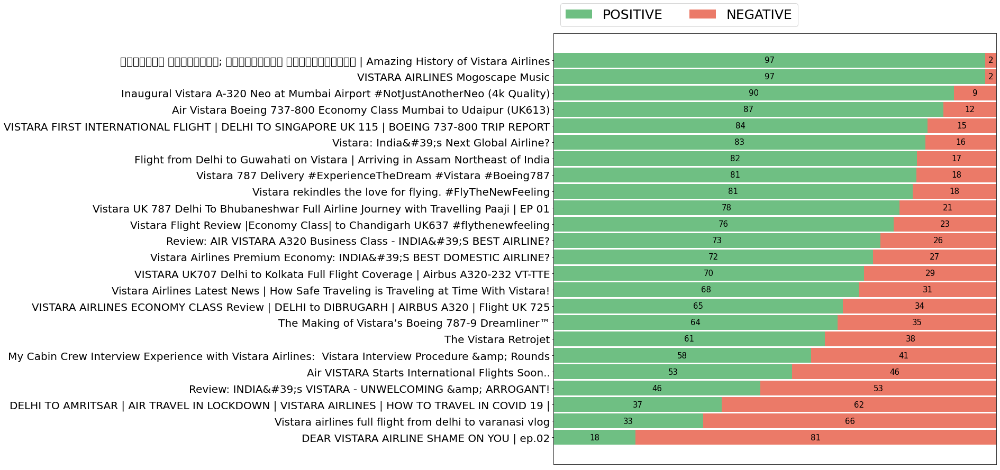

Named Entity Recognition 
-----------------
[   'Person Frequency',
    Counter({   'Vistara': 2,
                'Paaji': 1,
                'Deepika Padukone': 1,
                'Helloo': 1,
                'Ajay Awtaney': 1,
                'Rajeev Raja': 1,
                'The Vistara Retrojet': 1}),
    '-----------------']
[   'Organization Frequency',
    Counter({   'Vistara Airlines': 6,
                'Vistara': 6,
                'Boeing': 3,
                'Air Vistara': 2,
                "Air Vistara's": 1,
                'Delhi To Bhubaneswar & Bhubaneshwar': 1,
                'Delhi Flight': 1,
                'Vistara Airlines Premium Economy': 1,
                'Next Global Airline': 1,
                'Landing': 1,
                'Cabin': 1,
                'Air': 1,
                'GD/ Group': 1,
                'Indigo Airlines': 1,
                'Freshers in Airlines': 1,
                'Airbus': 1,
                'Limited Starts First International':

In [185]:
for airline in airlines_india:
  print(airline, '\n\n')
  get_results(airline)

## Analysis on Canadian Airlines

The results shown below are for top relevent search results returned by YouTube search engine

Air Canada
Word Cloud 
-----------------


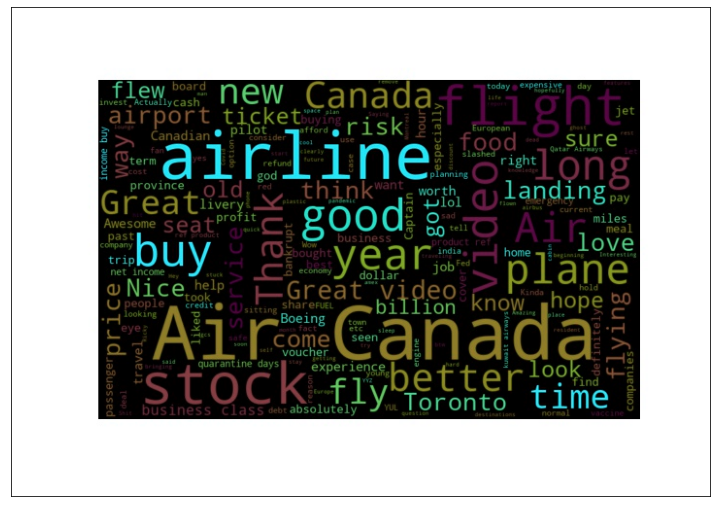

Sentiment Analysis 
-----------------


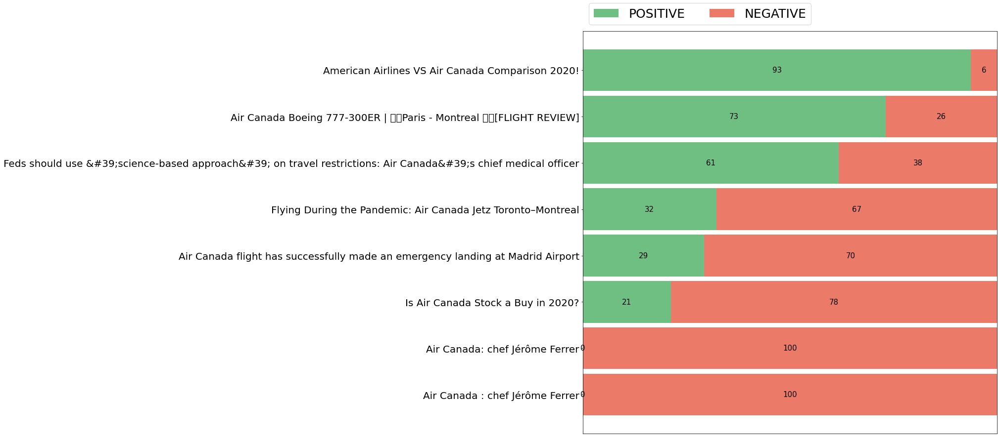

Named Entity Recognition 
-----------------
[   'Person Frequency',
    Counter({'Jérôme Ferrer': 2, 'Jetz Toronto': 1, 'John Gradek': 1}),
    '-----------------']
[   'Organization Frequency',
    Counter({   'Air Canada': 12,
                "Air Canada's": 5,
                'Boeing': 5,
                'Airbus': 2,
                'Air Canada&': 1,
                'Amazon': 1,
                'Facebook': 1,
                'Instagram/Twitter': 1,
                'Vancouver International': 1,
                'THREATENED': 1,
                'Rouge Premium': 1,
                'WestJet': 1,
                'Technical Duggal': 1,
                'American Airlines': 1,
                'Air Canada Stock': 1,
                'United Airlines': 1,
                'Trans-Canada Air Lines': 1,
                'Embraer': 1,
                'AIR CANADA Express': 1,
                'Air Canada Express': 1}),
    '-----------------']
[   'Location Frequency',
    Counter({   'Air Canada': 1,


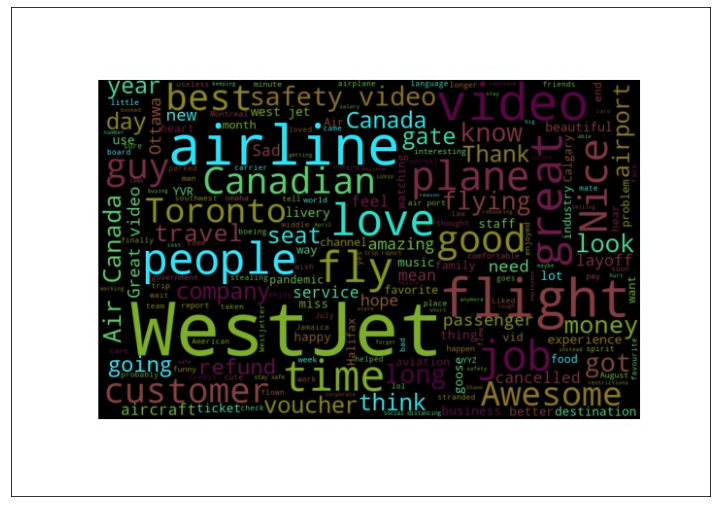

Sentiment Analysis 
-----------------


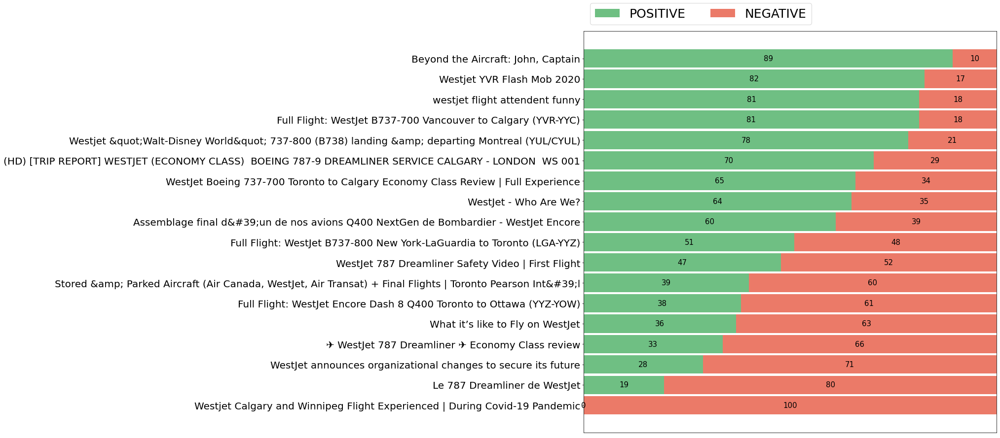

Named Entity Recognition 
-----------------
[   'Person Frequency',
    Counter({   'Jet Encore': 2,
                'Westjet': 2,
                'Westjetters': 1,
                'Tommy': 1,
                'Rick': 1,
                'John': 1,
                'Dashlane': 1,
                'Westjet Calgary': 1}),
    '-----------------']
[   'Organization Frequency',
    Counter({   'WestJet': 21,
                'Boeing': 6,
                'Westjet': 4,
                'Bombardier': 2,
                'Air Canada': 2,
                'Jet': 1,
                'WestJet Airlines': 1,
                'Jet Airlines Ltd.': 1,
                'Le Boeing': 1,
                'TripAdvisor': 1,
                'YVR-YYC': 1,
                'WS': 1,
                'YouTube': 1,
                'Transport Canada': 1,
                'Tinagirl Travels': 1,
                'WestJet Encore': 1,
                'Economy': 1,
                'Dreamliner': 1,
                'Walt-Disney World&qu

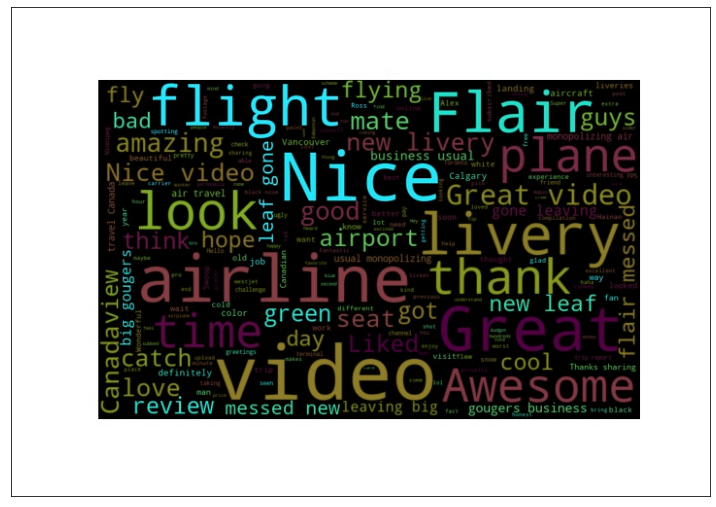

Sentiment Analysis 
-----------------


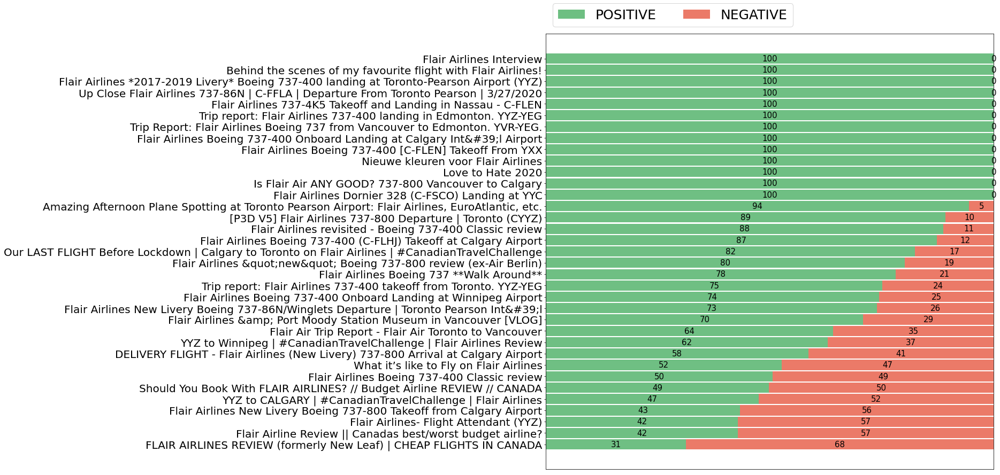

Named Entity Recognition 
-----------------
[   'Person Frequency',
    Counter({   'Flair': 3,
                'yyz-yeg': 2,
                'YYZ-YEG': 2,
                'Jessica Ainsley': 1,
                'Andrea Macpherson': 1,
                'Toronto Pearson': 1,
                'Tinagirl': 1,
                'Fokker Techniek': 1,
                'Nieuwe': 1,
                'Andrew Applepie': 1,
                'James Armstrong': 1,
                'Jordyn Parker': 1,
                'Takeoff': 1}),
    '-----------------']
[   'Organization Frequency',
    Counter({   'Flair Airlines': 42,
                'Boeing': 16,
                'Low Fare Airline': 2,
                'Flair Air': 2,
                'YYZ': 2,
                'Flying Flair Airlines': 1,
                'National': 1,
                'Flair Airline Review': 1,
                'Canadas': 1,
                'VancouverFlair Air YYZ': 1,
                'Flair Air Toronto': 1,
                'The Flair Airlin

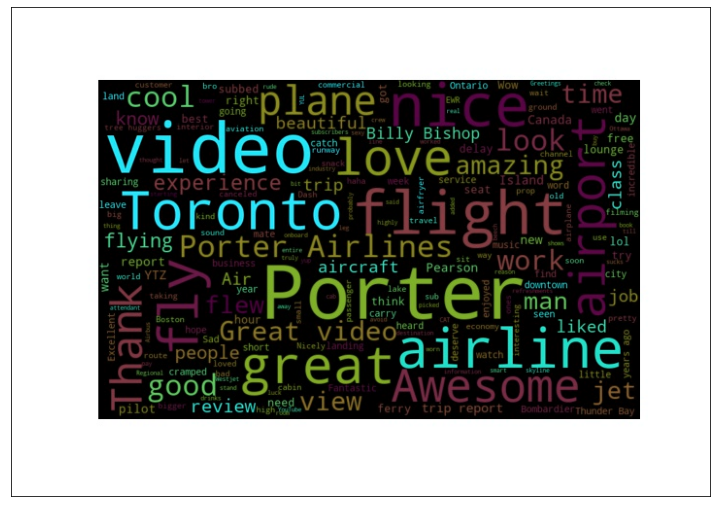

Sentiment Analysis 
-----------------


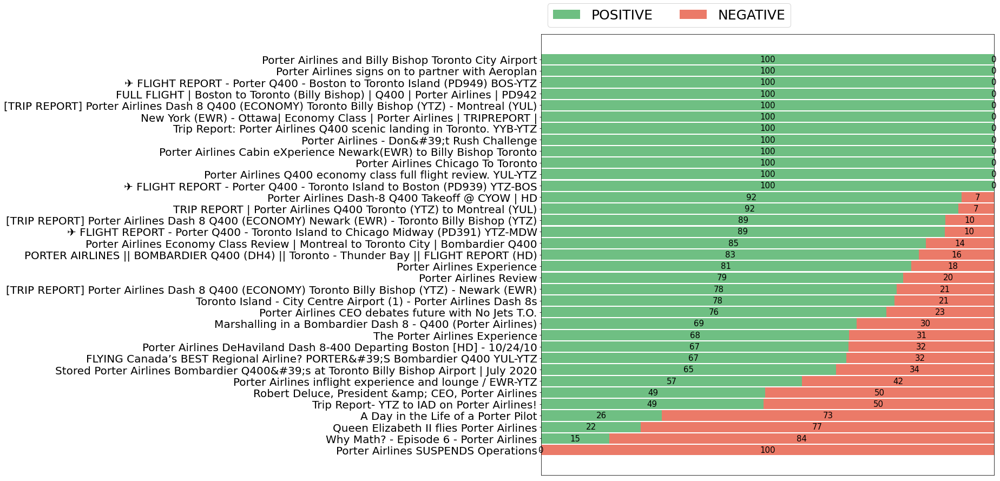

Named Entity Recognition 
-----------------
[   'Person Frequency',
    Counter({   'Billy Bishop': 6,
                'Porter': 2,
                'Robert Deluce': 2,
                'Elizabeth II': 1,
                'Brian Nixon': 1,
                'Anshul Kapoor': 1,
                'Mike Eppel': 1}),
    '-----------------']
[   'Organization Frequency',
    Counter({   'Porter Airlines': 40,
                'Bombardier': 5,
                'CYTZ': 2,
                'Porter': 2,
                'Best Regional Airline': 1,
                "Porter Airline's": 1,
                'YouTube': 1,
                'Bombardier Q400': 1,
                'PORTER AIRLINES': 1,
                "Porter Airlines'": 1,
                'YTZ': 1,
                'FULL FLIGHT | Boston': 1,
                'Toronto Billy Bishop': 1,
                'TRIP REPORT | Porter Airlines': 1,
                'Trip Report- YTZ': 1,
                'IAD': 1,
                'the Duke of Edinburgh': 1,
        

In [186]:
for airline in airlines_canada:
  print(airline)
  get_results(airline)

## Analysis on few of my favorite music bands and Flying Beast

The results shown below are for top relevent search results returned by YouTube search engine

flying beast
Word Cloud 
-----------------


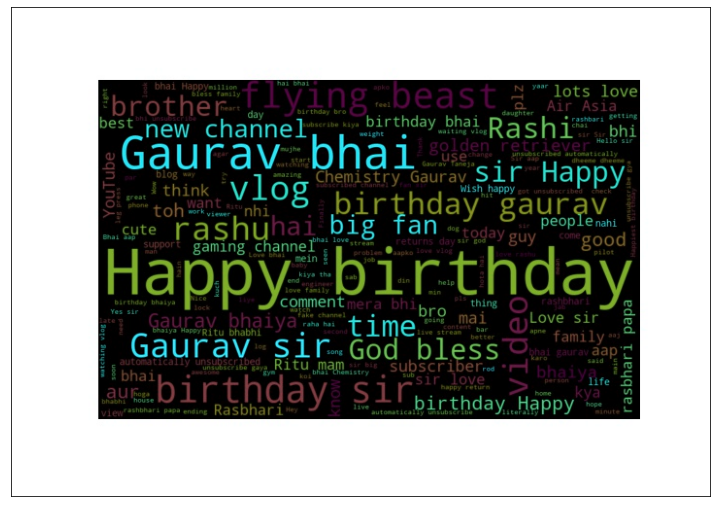

Sentiment Analysis 
-----------------


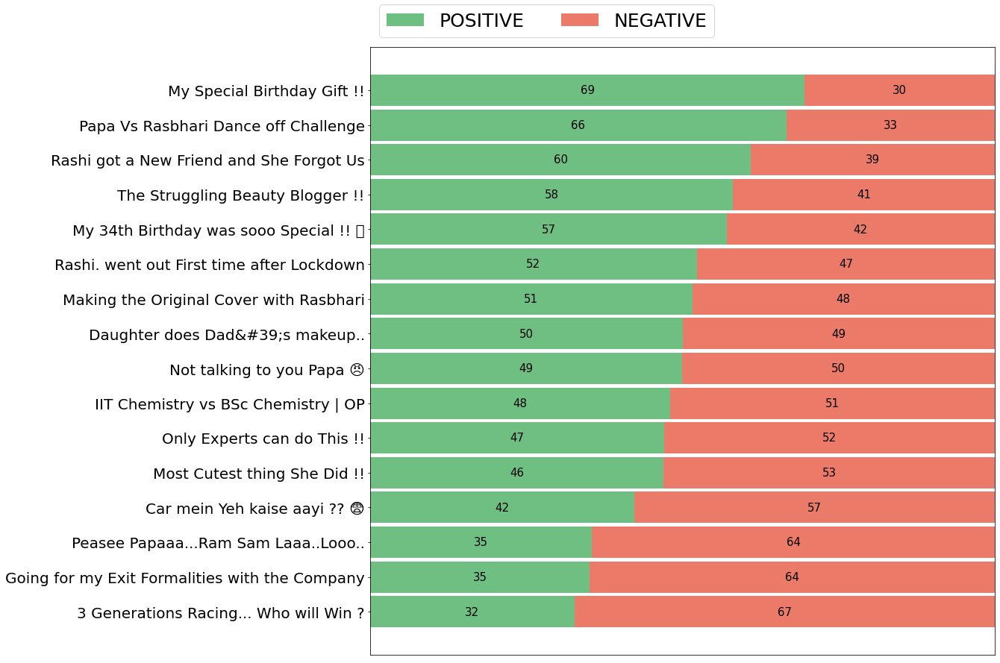

Named Entity Recognition 
-----------------
[   'Person Frequency',
    Counter({   'Gaurav': 15,
                'Rashi': 6,
                'Ritu': 5,
                'Rasbhari Ke Papa': 3,
                'Papa': 3,
                'Instagram': 2,
                'Dheeme Dheeme': 1,
                'Dad&#39': 1,
                'Bhuvan': 1,
                'Peasee Papaaa': 1,
                'Ram Sam Laaa..': 1,
                'dikhana': 1,
                'Dhruv Rathee': 1,
                'Gaurav Taneja': 1,
                'Chicklu': 1,
                'She Sang the &quot': 1,
                'Dada': 1,
                'Dadi': 1,
                'Mumma': 1}),
    '-----------------']
[   'Organization Frequency',
    Counter({   'The Derma co': 1,
                'Company': 1,
                'Health and Fitness': 1,
                'Mamaearth': 1,
                'PMO': 1,
                'Air Asia Airlines': 1,
                'Sony India': 1,
                'AirAsia Airline'

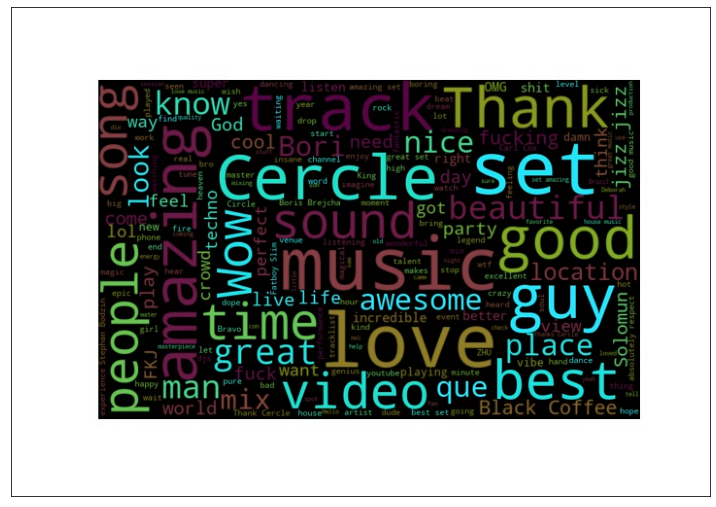

Sentiment Analysis 
-----------------


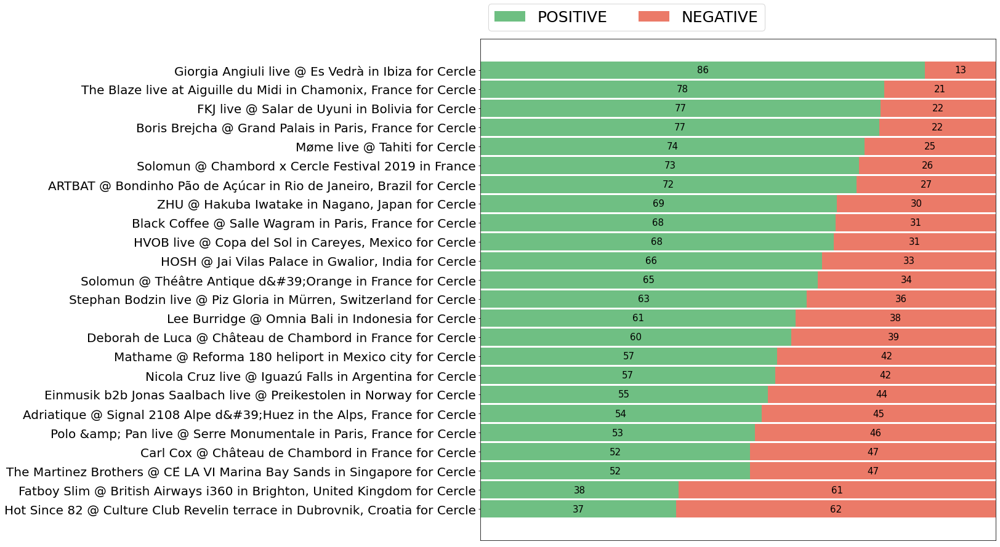

Named Entity Recognition 
-----------------
[   'Person Frequency',
    Counter({   'Lee Burridge': 1,
                'The Blaze': 1,
                'Hakuba Iwatake': 1,
                'Boris Brejcha': 1,
                'Einmusik': 1,
                'Jonas Saalbach': 1,
                'Artbat': 1,
                'HOSH': 1,
                'Solomun': 1,
                'Nicola Cruz': 1,
                'Fatboy Slim': 1,
                'Stephan Bodzin': 1,
                'Piz Gloria': 1,
                'Floatin Coconut': 1,
                'Martinez': 1,
                'Salle Wagram': 1,
                'Deborah de Luca': 1,
                'Mathame': 1,
                'Pan': 1,
                'Amelie Lens': 1,
                'Peggy Gou': 1,
                'Peggy': 1,
                'Garni': 1,
                'Acid Pauli': 1,
                'Giorgia Angiuli': 1,
                'Christian Löffler': 1}),
    '-----------------']
[   'Organization Frequency',
    Counter(

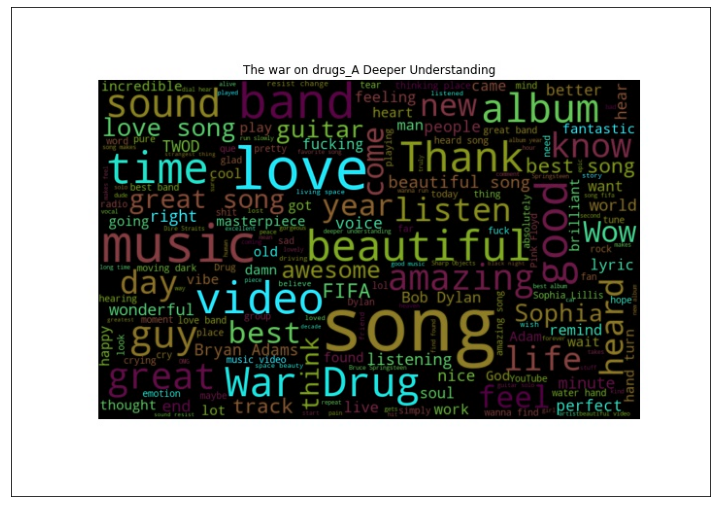

Sentiment Analysis 
-----------------


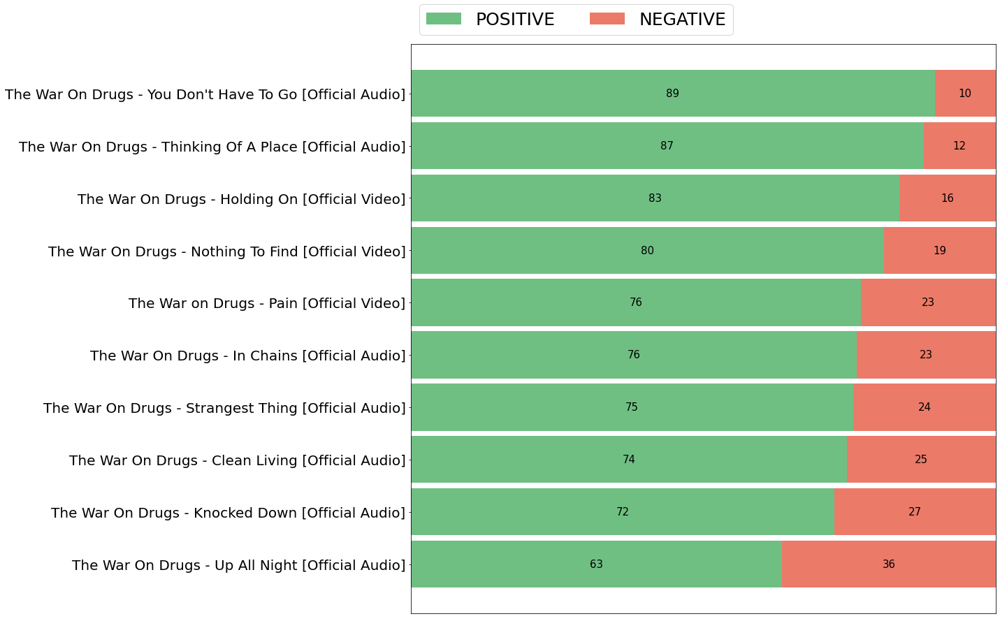

Named Entity Recognition 
-----------------
[   'Person Frequency',
    Counter({   'Emmett Malloy': 1,
                'Brett Haley': 1,
                'Frankie Faison': 1,
                'Krysten Ritter': 1,
                'Adam Granduciel': 1,
                'Shawn Brackbill': 1,
                'Niles Howard': 1,
                'Matt Day': 1,
                'Sophia Lillis': 1,
                'Kat Audick': 1,
                'Ben Fee': 1,
                'Kai Saul': 1}),
    '-----------------']
['Organization Frequency', Counter(), '-----------------']
['Location Frequency', Counter(), '-----------------']



Skinshape_Top Tracks - Skinshape
Word Cloud 
-----------------


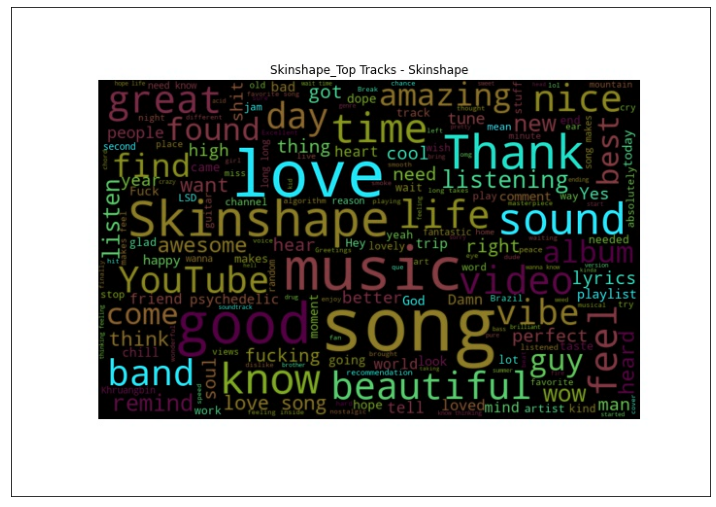

Sentiment Analysis 
-----------------


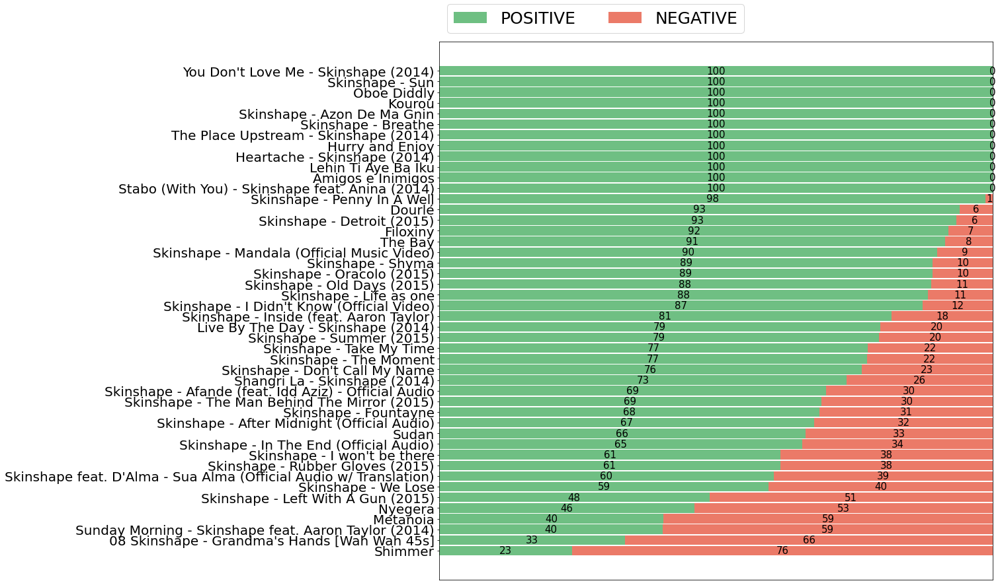

Named Entity Recognition 
-----------------
[   'Person Frequency',
    Counter({   'William Dorey': 11,
                'Skinshape': 8,
                'Umoja': 6,
                'Filoxiny': 3,
                'Will Dorey': 2,
                'Oracolo': 2,
                'Aaron Taylor': 2,
                'Idd Aziz': 2,
                'Kendra Morris': 1,
                'Eddie Wrey': 1,
                'Beatnik': 1,
                'Anina': 1,
                'Stabo': 1,
                "D'Alma - Sua Alma": 1,
                'Nazare Coutinho': 1,
                "D'Alma": 1,
                'Skinshape - The Moment': 1,
                'W Dorey': 1,
                'Skinshape - Afande': 1,
                'Afande': 1,
                'The Album - https://skinshape.bandcamp.com/album/life-love': 1,
                'Skinshape - Shyma': 1,
                'Skinshape - Fountayne': 1,
                'Skinshape - Sun': 1,
                'Victor Souza': 1,
                'Skinshape - B

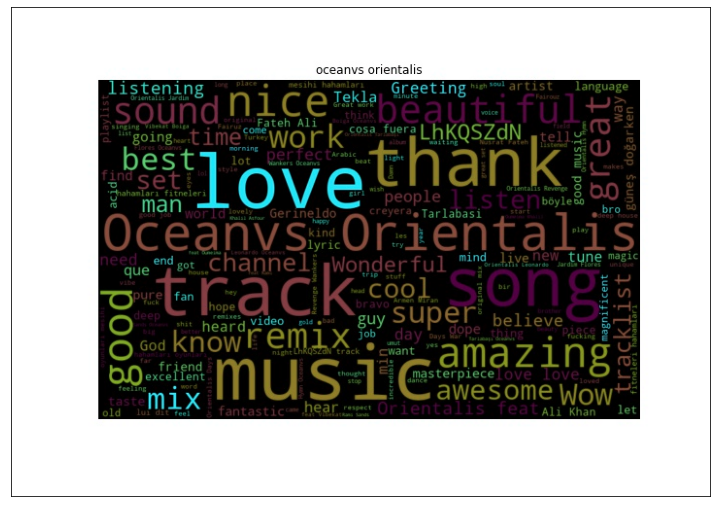

Sentiment Analysis 
-----------------


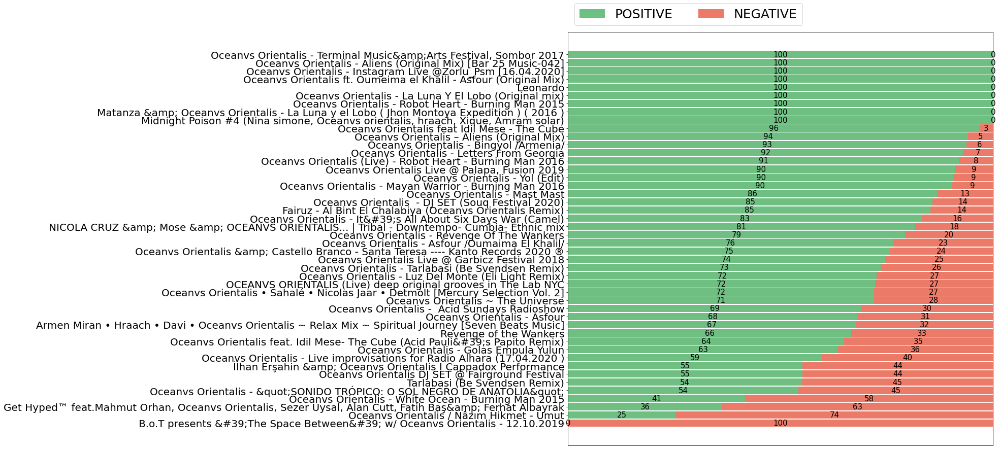

Named Entity Recognition 
-----------------
[   'Person Frequency',
    Counter({   'Oceanvs Orientalis': 12,
                'Tekla DuDuchava': 3,
                'Oceanvs Orientalis - Asfour': 2,
                '- Luz Del Monte': 1,
                'Palapa': 1,
                'Nicolas': 1,
                'Nicolas Jaar': 1,
                'Hani Niroo - شب بود': 1,
                'Fairuz - Al Bint El Chalabiya': 1,
                'Revenge of the Wankers': 1,
                'Castello': 1,
                'Oumaima El Khalil': 1,
                'Nicola Cruz www.nicolacruz.com': 1,
                'Vida': 1,
                'Lulu Rouge': 1,
                'Midnight Poison': 1,
                'Nina Simone': 1,
                'Armen Miran': 1,
                'Oumeima el Khalil - Asfour': 1,
                'Alan Cutt': 1,
                'Sezer Uysal': 1,
                'Mahmut Orhan': 1,
                'Fatih Baş&amp': 1,
                'Elektronik Müzik Konferansı': 1,
     

In [187]:
for search in other_searches:
  print(search)
  get_results(search)